#### Topic Model Viz

In [2]:
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
import pandas as pd
import numpy as np
import os 

In [82]:
## define some paths 
MODEL_OUTPUT = '/data/chuang/Language_Model_Training_Data/Models/Topic_Models/step_10000'
TOPIC_MODEL_PATH = os.path.join(MODEL_OUTPUT,'topic_model_v2_mreged') ##  v3_nt414_ch0464   v1_nt2085_ch0526
SBERT_CHECKPOINT = '/data/chuang/Language_Model_Training_Data/Models/Saved_SBERT/10000'

emb_path = os.path.join(MODEL_OUTPUT,'sentence_embeddings.npy')
docs_path = os.path.join(MODEL_OUTPUT,'docs.npy')
topics_path = os.path.join(MODEL_OUTPUT,'topics_v2.npy')
probabiliteis_path = os.path.join(MODEL_OUTPUT,'probabilities_v2.npy')
reduced_emb_path = os.path.join(MODEL_OUTPUT,'reduced_embeddings.npy')

OUT_TOPIC_EVAL = '/data/chuang/Language_Model_Training_Data/Models/Topic_Models/step_10000/topic_stats_v2_merged.xlsx'

### Load model and data 

In [4]:
## load documents during training
embeddings = np.load(emb_path)
docs = np.load(docs_path)
assert len(docs)==len(embeddings)# == len(probs) == len(topics)
print('Number of docs: {}'.format(len(docs)))

Number of docs: 613206


In [5]:
## if trained without embedding modle, manually load embedding model here
#sentence_model = SentenceTransformer(SBERT_CHECKPOINT)          
topic_model = BERTopic.load(TOPIC_MODEL_PATH) #,embedding_model=sentence_model
topic_model.calculate_probabilities = True

## basic inference check
t,p = topic_model.transform(docs[:10])
print('prob dimensions:{}'.format(p[0].size))
## check if p is alwasy the one with highest prob
for i in range(10):
    idx = np.array(p[i]).argmax()
    print(sum(p[i]),p[i][idx])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

prob dimensions:434
0.9999999989825993 0.9999999989825993
0.6520841915502011 0.6520841915502011
0.8153809365973061 0.03236068552699467
0.9999999996987273 0.9999959477639091
0.9999999993717863 0.9999999740691946
0.9999999993547093 0.9985349895137141
0.9999999997170723 0.9999999997170723
0.9999999995678595 0.9999999308379278
0.9667329656695398 0.7646435797735135
0.9649145117101872 0.9649145116082938


#### Viz topic distribution 

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

In [65]:
## get topic distribution over the entime sample 
topic_dist_df = topic_model.get_topic_info()
topic_dist_df[['topic_l1', 'topic_l2', 'topic_l3']] = topic_dist_df['CustomName'].str.split('--', expand=True)
topic_dist_df['topic_l12'] = topic_dist_df['topic_l1'].astype(str) + "--" +topic_dist_df['topic_l2'].astype(str)
topic_dist_df.drop(columns=['CustomName'], inplace=True)
topic_dist_df = topic_dist_df.drop(0)
topic_dist_df.head()

,Topic,Count,Name,topic_l1,topic_l2,topic_l3,topic_l12
1,0,24425,0_growth_current account_projected_account def...,External,Balance of Payments,Current Account,External--Balance of Payments
2,1,14879,1_washington_working paper_paper_pp,Others,Publications,Working Papers,Others--Publications
3,2,9151,2_banks_loans_credit_npls,FInancial,Financial Stability and Systemic Risk,Bank Profitability/Risks,FInancial--Financial Stability and Systemic Risk
4,3,9091,3_statistics_data_national accounts_accounts,Statistics,Data Provision,Data Provision,Statistics--Data Provision
5,4,7935,4_supervision_supervisory_banking_financial,FInancial,Financial Sector Regulation,Financial Sector Regulation,FInancial--Financial Sector Regulation


In [73]:

df = topic_dist_df.groupby('topic_l12')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
df_sample = df.head(40)


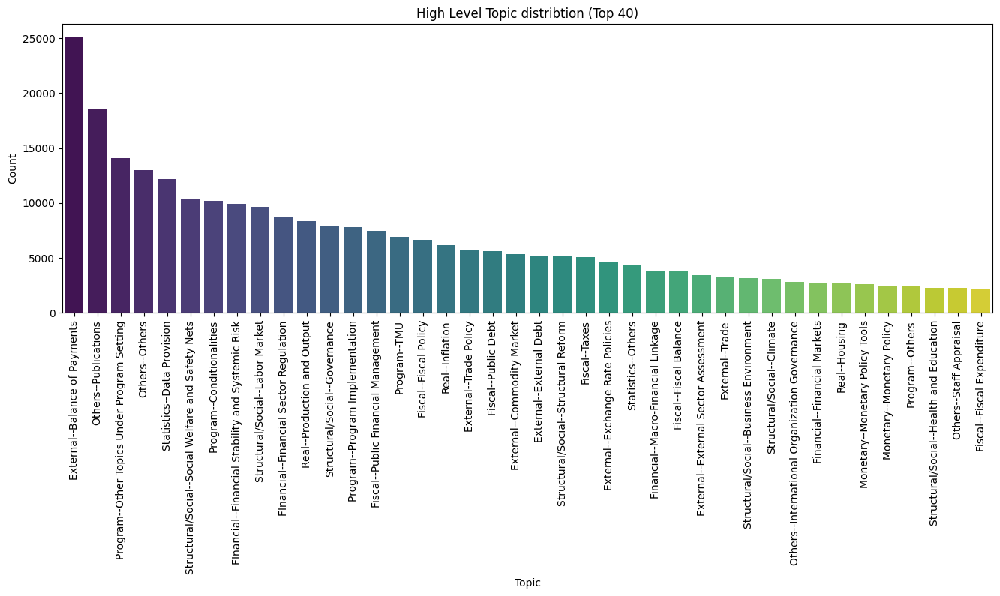

In [75]:
plt.figure(figsize=(16, 5))  # Set the figure size (optional)
# Create the bar chart
sns.barplot(x='topic_l12', y='Count', data=df_sample, palette='viridis')
# Add labels and a title
plt.xlabel('Topic')
plt.ylabel('Count')
plt.title('High Level Topic distribtion (Top 40)')
plt.xticks(rotation=90)
# Show the plot
plt.show()

In [102]:
topic_model.visualize_barchart(top_n_topics=15,n_words=10,custom_labels=True,width=450)

In [49]:
topic_model.visualize_topics()

In [11]:
#topic_model.visualize_hierarchy()

In [50]:
topic_model.visualize_heatmap(custom_labels=True)

In [77]:
# from umap import UMAP
# reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
# np.save(reduced_emb_path, reduced_embeddings)
reduced_embeddings = np.load(reduced_emb_path)


In [120]:
# topic_model.visualize_documents(docs, 
#                                 embeddings=embeddings,
#                                 sample=0.3,
#                                 hide_document_hover=True,
#                                 hide_annotations=True,
#                                 custom_labels=True)

# topic_model.visualize_documents(docs, 
#                                 reduced_embeddings=reduced_embeddings,
#                                 sample=0.1,
#                                 hide_document_hover=True,
#                                 hide_annotations=True,
#                                 custom_labels=True)

In [104]:
import pandas as pd
import plotly.express as px

In [105]:
#tune_res_f_p = '/data/chuang/Language_Model_Training_Data/Data/Raw_LM_Data/temp_topic_model/temp_results/hp_tune_results_p2.csv'
tune_res_f_p = '/data/chuang/Language_Model_Training_Data/Models/Topic_Models/step_10000/Archieve_results/hp_tune_results_1.csv'
df = pd.read_csv(tune_res_f_p)

In [106]:
df.head()

,Unnamed: 0,n_neighbors,n_components,min_cluster_size,min_samples,metric,top_n_words,coherence,diversity,outlier,number_topics
0,0,5,8,20,4,euclidean,30,0.379396,0.409132,0.540639,3139
1,1,5,8,40,40,euclidean,5,0.456839,0.733902,0.583766,469
2,2,5,8,40,40,euclidean,10,0.376127,0.636034,0.583766,469
3,3,5,8,40,40,euclidean,20,0.379913,0.530490,0.583766,469
4,4,5,8,40,40,euclidean,30,0.379913,0.471500,0.583766,469


In [112]:
viz_df = df[['n_neighbors','n_components','min_cluster_size','min_samples','top_n_words','number_topics','coherence','outlier']]
viz_df.fillna(0,inplace=True)

dims = ["n_components","min_cluster_size","min_samples","number_topics","outlier","outlier","top_n_words","coherence"]
df_filter = (df['coherence']>0.0) #& (df['outlier']<0.4) & (df['number_topics']>40)
chart_df = viz_df[df_filter]
# Create the chart:
fig = px.parallel_coordinates(
    chart_df, 
    color="coherence", 
    dimensions=dims,
    #labels={"species_id": "Species","sepal_width": "Sepal Width", "sepal_length": "Sepal Length", "petal_width": "Petal Width", "petal_length": "Petal Length", },
    color_continuous_scale=px.colors.diverging.RdYlBu, # color reference https://plotly.com/python/builtin-colorscales/#builtin-diverging-color-scales
    color_continuous_midpoint=0.4)
fig.update_layout() #coloraxis_showscale=False # if you want to hide score scale 
# Show the plot
fig.show()

In [117]:
import json

hp_file = '/data/chuang/Language_Model_Training_Data/Models/Topic_Models/hyper_param_space_large.jsonl'

def load_jsonl(fn):
    result = []
    with open(fn, 'r') as f:
        for line in f:
            data = json.loads(line)
            result.append(data)
    return result 

hp = load_jsonl(hp_file)
print('total number of hp to be tuned : {}'.format(len(hp)))

total number of hp to be tuned : 1920


In [119]:
print('total number of docs :{}'.format(len(docs)))

total number of docs :613206
